<a href="https://colab.research.google.com/github/leonardoelis/AnaliseFIFA19/blob/main/PotencialPaises.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<h1>Análise FIFA 19: Países com maiores potenciais de jogadores</h1>
Esse notebook tem como objetivo realizar uma análise de alguns dados dos jogadores presentes no jogo FIFA 19. A análise a ser feita busca mostrar os países que possuem os jogadores com maior potencial.

Para iniciar, é necessário importar algumas bibliotecas que irão facilitar essa análise.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import operator

A base de dados utilizada pode ser encontrada em: https://www.kaggle.com/karangadiya/fifa19

Para importar o arquivo, é necessário utilizar uma biblioteca, como no código abaixo.

In [ ]:
from google.colab import files
files.upload()

Saving data.csv to data.csv


{'data.csv': b'\xef\xbb\xbf,ID,Name,Age,Photo,Nationality,Flag,Overall,Potential,Club,Club Logo,Value,Wage,Special,Preferred Foot,International Reputation,Weak Foot,Skill Moves,Work Rate,Body Type,Real Face,Position,Jersey Number,Joined,Loaned From,Contract Valid Until,Height,Weight,LS,ST,RS,LW,LF,CF,RF,RW,LAM,CAM,RAM,LM,LCM,CM,RCM,RM,LWB,LDM,CDM,RDM,RWB,LB,LCB,CB,RCB,RB,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Release Clause\n0,158023,L. Messi,31,https://cdn.sofifa.org/players/4/19/158023.png,Argentina,https://cdn.sofifa.org/flags/52.png,94,94,FC Barcelona,https://cdn.sofifa.org/teams/2/light/241.png,\xe2\x82\xac110.5M,\xe2\x82\xac565K,2202,Left,5,4,4,Medium/ Medium,Messi,

In [ ]:
# Algumas informações sobre os dados
dados = pd.read_csv("data.csv")
print(dados)
dados.info()
dados.describe().transpose()

       Unnamed: 0      ID  ... GKReflexes  Release Clause
0               0  158023  ...        8.0         €226.5M
1               1   20801  ...       11.0         €127.1M
2               2  190871  ...       11.0         €228.1M
3               3  193080  ...       94.0         €138.6M
4               4  192985  ...       13.0         €196.4M
...           ...     ...  ...        ...             ...
18202       18202  238813  ...        9.0           €143K
18203       18203  243165  ...       12.0           €113K
18204       18204  241638  ...       13.0           €165K
18205       18205  246268  ...        9.0           €143K
18206       18206  246269  ...        9.0           €165K

[18207 rows x 89 columns]
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18207 entries, 0 to 18206
Data columns (total 89 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Unnamed: 0                18207 non-null  int64  
 1 

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,18207.0,9103.000000,5256.052511,0.0,4551.5,9103.0,13654.5,18206.0
ID,18207.0,214298.338606,29965.244204,16.0,200315.5,221759.0,236529.5,246620.0
Age,18207.0,25.122206,4.669943,16.0,21.0,25.0,28.0,45.0
Overall,18207.0,66.238699,6.908930,46.0,62.0,66.0,71.0,94.0
Potential,18207.0,71.307299,6.136496,48.0,67.0,71.0,75.0,95.0
Special,18207.0,1597.809908,272.586016,731.0,1457.0,1635.0,1787.0,2346.0
International Reputation,18159.0,1.113222,0.394031,1.0,1.0,1.0,1.0,5.0
Weak Foot,18159.0,2.947299,0.660456,1.0,3.0,3.0,3.0,5.0
Skill Moves,18159.0,2.361308,0.756164,1.0,2.0,2.0,3.0,5.0
Jersey Number,18147.0,19.546096,15.947765,1.0,8.0,17.0,26.0,99.0


Pelas informações observadas, tem-se algumas colunas que não serão úteis nesse momento, por isso, elas serão removidas do DataFrame.

In [ ]:
dados = dados.iloc[:, 1:89]
dados = dados.drop(columns=["Photo", "Flag", "Club Logo"])
print(dados)
dados.info()
dados.describe().transpose()

           ID                Name  ...  GKReflexes Release Clause
0      158023            L. Messi  ...         8.0        €226.5M
1       20801   Cristiano Ronaldo  ...        11.0        €127.1M
2      190871           Neymar Jr  ...        11.0        €228.1M
3      193080              De Gea  ...        94.0        €138.6M
4      192985        K. De Bruyne  ...        13.0        €196.4M
...       ...                 ...  ...         ...            ...
18202  238813        J. Lundstram  ...         9.0          €143K
18203  243165  N. Christoffersson  ...        12.0          €113K
18204  241638           B. Worman  ...        13.0          €165K
18205  246268      D. Walker-Rice  ...         9.0          €143K
18206  246269           G. Nugent  ...         9.0          €165K

[18207 rows x 85 columns]
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18207 entries, 0 to 18206
Data columns (total 85 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------      

,count,mean,std,min,25%,50%,75%,max
ID,18207.0,214298.338606,29965.244204,16.0,200315.5,221759.0,236529.5,246620.0
Age,18207.0,25.122206,4.669943,16.0,21.0,25.0,28.0,45.0
Overall,18207.0,66.238699,6.908930,46.0,62.0,66.0,71.0,94.0
Potential,18207.0,71.307299,6.136496,48.0,67.0,71.0,75.0,95.0
Special,18207.0,1597.809908,272.586016,731.0,1457.0,1635.0,1787.0,2346.0
International Reputation,18159.0,1.113222,0.394031,1.0,1.0,1.0,1.0,5.0
Weak Foot,18159.0,2.947299,0.660456,1.0,3.0,3.0,3.0,5.0
Skill Moves,18159.0,2.361308,0.756164,1.0,2.0,2.0,3.0,5.0
Jersey Number,18147.0,19.546096,15.947765,1.0,8.0,17.0,26.0,99.0
Crossing,18159.0,49.734181,18.364524,5.0,38.0,54.0,64.0,93.0


Para definir os países com os jogadores com maiores potenciais, os dados serão agrupados por nacionalidade e em seguida, será feita a soma das colunas por nacionalidade. Após isso o DataFrame será ordenado pela coluna "Potential", para ser mais fácil acessar as maiores somas de potenciais.

In [ ]:
# Soma dos potenciais dos jogadores por país
print(dados.groupby(['Nationality']).sum(numeric_only=True))
agrupNacSoma = dados.groupby(['Nationality']).sum(numeric_only=True)
agrupNacSoma = agrupNacSoma.sort_values(by=['Potential'])
print(agrupNacSoma)

                   ID   Age  Overall  ...  GKKicking  GKPositioning  GKReflexes
Nationality                           ...                                      
Afghanistan    938974    90      244  ...       37.0           34.0        37.0
Albania       8867298   961     2637  ...      530.0          518.0       561.0
Algeria      12381343  1623     4238  ...      888.0          911.0       948.0
Andorra        192937    28       62  ...       12.0            8.0         6.0
Angola        3100140   388     1014  ...      147.0          153.0       153.0
...               ...   ...      ...  ...        ...            ...         ...
Uzbekistan     379170    59      135  ...       25.0           21.0        25.0
Venezuela    15066936  1629     4507  ...      891.0          948.0       943.0
Wales        26018094  3191     8274  ...     2071.0         2060.0      2048.0
Zambia        2130755   200      587  ...       86.0           94.0       100.0
Zimbabwe      2754151   349      907  ..

Com os dados já ordenados, serão escolhidos os 10 países com maior soma de potencial.

In [ ]:
paisesSoma = []
potencialSoma = []

# Pega o nome dos 10 países que possuem a maior soma de potencial de seus jogadores, juntamente com os respectivos potenciais
for i in range(agrupNacSoma.shape[0] - 1, agrupNacSoma.shape[0] - 11, -1):
    # Pega o nome da linha, que é o nome do país
    paisesSoma.append(agrupNacSoma.index[i])
    # Pega o valor do potencial
    potencialSoma.append(agrupNacSoma.iloc[i, 3])

print("Países: ",paisesSoma)
print("Pot: ", potencialSoma)

Países:  ['England', 'Germany', 'Spain', 'Argentina', 'France', 'Brazil', 'Italy', 'Colombia', 'Netherlands', 'Japan']
Pot:  [116402, 85896, 79989, 68598, 67131, 60662, 51029, 43904, 33080, 31851]


Para se ter uma melhor visualização, será plotado um gráfico de barras com esses dados obtidos.

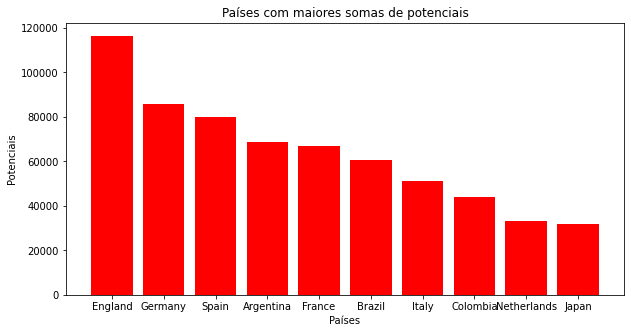

In [ ]:
plt.figure(figsize=(10, 5))
plt.bar(paisesSoma, potencialSoma, color="red")
plt.title("Países com maiores somas de potenciais")
plt.xlabel("Países")
plt.ylabel("Potenciais")
plt.show()

De acordo com o gráfico obtido, pode-se perceber que a Inglaterra está muito a frente do segundo colocado. Isso não necessariamente significa que a Inglaterra possui os jogadores com maiores potenciais, pois a Inglaterra, no FIFA 19, possui muitos jogadores, já que as 4 primeiras divisões do país estão presentes no jogo, com todos os times. Então, o que pode ter acontecido aqui é a presença de vários jogadores ingleses que possuem um potencial mediano (ou até mesmo baixo) e somando todos eles, gerou um volume grande de potencial, fazendo com que a Inglaterra ficasse em primeiro lugar. Esse número grande de jogadores ingleses no jogo pode ser visto a seguir.


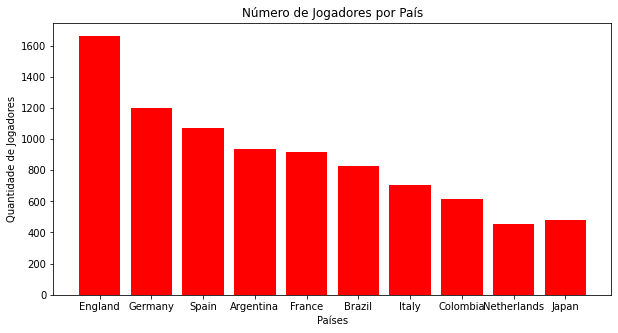

In [ ]:
# Quantidade de jogadores por país (considerando os 10 países utilizados no gráfico anterior)
quantidadeJogadores = []
for pais in paisesSoma:
    quantidadeJogadores.append(dados.groupby(['Nationality']).count().loc[pais, 'ID'])

plt.figure(figsize=(10, 5))
plt.bar(paisesSoma, quantidadeJogadores, color="red")
plt.title("Número de Jogadores por País")
plt.xlabel("Países")
plt.ylabel("Quantidade de Jogadores")
plt.show()

Pode-se observar que realmente a Inglaterra tem bem mais jogadores que os outros países, o que pode ter influenciado na soma dos potenciais. Dessa forma, uma outra estratégia para definir os países com os jogadores com maiores potenciais é utilizando a média dos potenciais por país. Para isso, foi feito um procedimento semelhante ao que foi feito na soma dos potenciais.

                                 ID        Age  ...  GKPositioning  GKReflexes
Nationality                                     ...                           
Belize                232014.000000  25.000000  ...      10.000000    8.000000
Malta                 208797.000000  25.000000  ...      10.000000   15.000000
Puerto Rico           164618.000000  34.000000  ...      10.000000    9.000000
South Sudan           241502.000000  25.000000  ...      10.000000    9.000000
St Kitts Nevis        220145.000000  26.333333  ...      14.000000    8.333333
...                             ...        ...  ...            ...         ...
Russia                212599.189873  24.962025  ...      21.012658   21.582278
Central African Rep.  211711.000000  25.666667  ...       8.000000   10.000000
Chad                  237863.000000  22.500000  ...      13.000000   11.000000
United Arab Emirates  245221.000000  26.000000  ...      11.000000    8.000000
Dominican Republic    232476.500000  23.000000  ... 

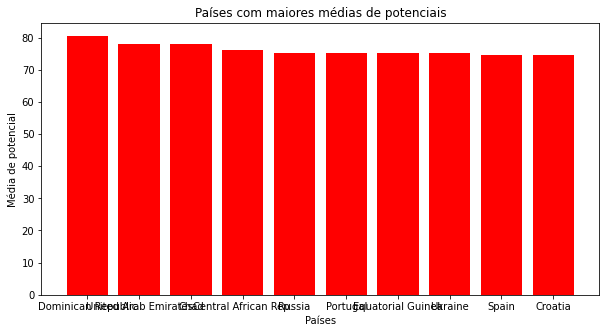

In [ ]:
# Média dos potenciais dos jogadores por país
agrupNacMedia = dados.groupby(['Nationality']).mean(numeric_only=True)
agrupNacMedia = agrupNacMedia.sort_values(by=['Potential'])
print(agrupNacMedia)
paisesMedia = []
potencialMedia = []

# Pega o nome dos 10 países que possuem a maior média de potencial de seus jogadores, juntamente com os respectivos potenciais
for i in range(agrupNacMedia.shape[0] - 1, agrupNacMedia.shape[0] - 11, -1):
    paisesMedia.append(agrupNacMedia.index[i])
    potencialMedia.append(agrupNacMedia.iloc[i, 3])

print("Países: ",paisesMedia)
print("Pot: ", potencialMedia)

plt.figure(figsize=(10, 5))
plt.bar(paisesMedia, potencialMedia, color="red")
plt.title("Países com maiores médias de potenciais")
plt.xlabel("Países")
plt.ylabel("Média de potencial")
plt.show()

Nesse gráfico, foi obtido alguns resultados um pouco estranhos, como a presença de alguns países com pouca tradição no futebol (República Dominicana, Emirados Árabes Unidos, República Centro Africana, etc). Para tentar entender um pouco melhor esses resultados, abaixo é feita a análise de números de jogadores por país, como foi feito anteriormente.

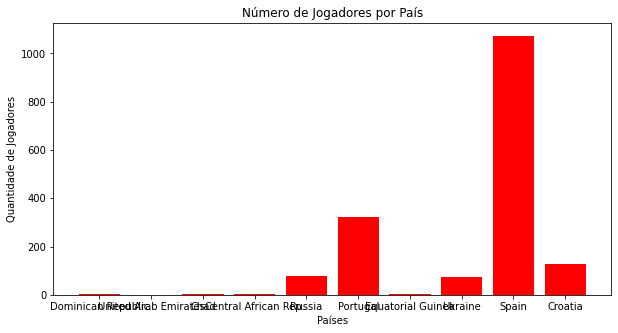

In [ ]:
# Quantidade de jogadores por país (considerando apenas os países do gráfico anterior)
quantidadeJogadores = []
for pais in paisesMedia:
    quantidadeJogadores.append(dados.groupby(['Nationality']).count().loc[pais, 'ID'])

plt.figure(figsize=(10, 5))
plt.bar(paisesMedia, quantidadeJogadores, color="red")
plt.title("Número de Jogadores por País")
plt.xlabel("Países")
plt.ylabel("Quantidade de Jogadores")
plt.show()

Analisando o gráfico, pode-se dizer que apenas Espanha e Portugal apresentam uma quantidade relevante de jogadores. Os outros países, por possuírem poucos atletas no jogo, acabaram sendo beneficiados pela média, já que o valor da soma dos potenciais é dividido por um valor baixo. Pensando nisso, a próxima análise é feita pela média também, porém considerando apenas os países que tenham pelo menos 200 jogadores no jogo. 

In [ ]:
# Média dos potenciais dos jogadores, considerando apenas os países com mais de 200 jogadores
paisesSig = []
potencialSig = []
# Soma a quantidade de jogadores por país
x = dados.groupby(['Nationality']).count()
print(x)
for i in range(0, x.shape[0], 1):
    if x.iloc[i, 0] >= 200:
        paisesSig.append(x.index[i])
        potencialSig.append(dados.groupby(['Nationality']).mean(numeric_only=True).iloc[i, 3])

print(paisesSig)
print(potencialSig)

              ID  Name  Age  ...  GKPositioning  GKReflexes  Release Clause
Nationality                  ...                                           
Afghanistan    4     4    4  ...              4           4               4
Albania       40    40   40  ...             39          39              37
Algeria       60    60   60  ...             60          60              56
Andorra        1     1    1  ...              1           1               1
Angola        15    15   15  ...             15          15              13
...          ...   ...  ...  ...            ...         ...             ...
Uzbekistan     2     2    2  ...              2           2               2
Venezuela     67    67   67  ...             66          66              52
Wales        129   129  129  ...            129         129             116
Zambia         9     9    9  ...              9           9               9
Zimbabwe      13    13   13  ...             13          13              13

[164 rows x

Os resultados agora aparentam estar um pouco mais condizentes, mas para uma melhor visualização, é necessário plotar um gráfico de barras. Porém se o gráfico for plotado dessa forma, as barras serão ordenadas por ordem alfabética dos países, o que dificultaria a visualização e entendimento do gráfico. O ideal seria um gráfico ordenado pelo potencial.

Para isso, é preciso criar um dicionário, onde a chave é o nome do país e o valor é o potencial. Após isso, é necessário ordenar esse dicionário pelo valor. Isso pode ser visto no código abaixo.

In [ ]:
# Cria um dicionário, onde a chave é o nome do país e o valor é a média do potencial desse país
dicPaisesPot = {}
for i in range(0, len(paisesSig), 1):
    dicPaisesPot[paisesSig[i]] = potencialSig[i]

print(dicPaisesPot)
# Ordena o dicionário pelo potencial
ordenado = sorted(dicPaisesPot.items(), key=operator.itemgetter(1))

{'Argentina': 73.21024546424759, 'Australia': 68.36016949152543, 'Austria': 69.84563758389261, 'Belgium': 74.38846153846154, 'Brazil': 73.35187424425635, 'Chile': 70.6854219948849, 'China PR': 63.71938775510204, 'Colombia': 71.042071197411, 'Denmark': 70.05059523809524, 'England': 70.03730445246691, 'France': 73.44748358862144, 'Germany': 71.69949916527545, 'Italy': 72.69088319088318, 'Japan': 66.63389121338912, 'Korea Republic': 67.51940298507462, 'Mexico': 71.50819672131148, 'Netherlands': 73.0242825607064, 'Norway': 69.43695014662757, 'Poland': 68.82, 'Portugal': 75.29813664596273, 'Republic of Ireland': 66.88858695652173, 'Saudi Arabia': 66.36764705882354, 'Scotland': 70.26923076923077, 'Spain': 74.61660447761194, 'Sweden': 68.93954659949623, 'Switzerland': 71.98181818181818, 'Turkey': 71.7887788778878, 'United States': 70.51558073654391}


Com o dicionário já ordenado pelo valor, é criada duas listas, uma para armazenar os nomes dos países e a outra para guardar os valores dos potenciais. Por fim, é plotado o gráfico de barras horizontais, ordenado pelo valor dos potenciais.

[('China PR', 63.71938775510204), ('Saudi Arabia', 66.36764705882354), ('Japan', 66.63389121338912), ('Republic of Ireland', 66.88858695652173), ('Korea Republic', 67.51940298507462), ('Australia', 68.36016949152543), ('Poland', 68.82), ('Sweden', 68.93954659949623), ('Norway', 69.43695014662757), ('Austria', 69.84563758389261), ('England', 70.03730445246691), ('Denmark', 70.05059523809524), ('Scotland', 70.26923076923077), ('United States', 70.51558073654391), ('Chile', 70.6854219948849), ('Colombia', 71.042071197411), ('Mexico', 71.50819672131148), ('Germany', 71.69949916527545), ('Turkey', 71.7887788778878), ('Switzerland', 71.98181818181818), ('Italy', 72.69088319088318), ('Netherlands', 73.0242825607064), ('Argentina', 73.21024546424759), ('Brazil', 73.35187424425635), ('France', 73.44748358862144), ('Belgium', 74.38846153846154), ('Spain', 74.61660447761194), ('Portugal', 75.29813664596273)]
['China PR', 'Saudi Arabia', 'Japan', 'Republic of Ireland', 'Korea Republic', 'Australia

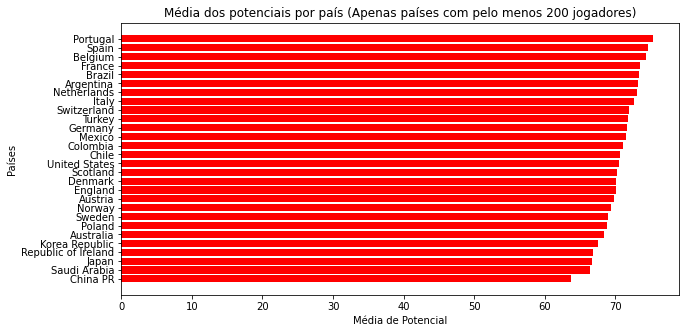

In [ ]:
# Cria duas listas, uma para as chaves do dicionário (nome dos países) e outra para os valores (potenciais)
chaves = []
valores = []
for i in range(0, len(ordenado), 1):
    chaves.append(ordenado[i][0])
    valores.append(ordenado[i][1])

print(ordenado)
print(chaves)
print(valores)
# Plota o gráfico ordenado pelo potencial
plt.figure(figsize=(10, 5))
plt.barh(chaves, valores, color="red")
plt.title("Média dos potenciais por país (Apenas países com pelo menos 200 jogadores)")
plt.xlabel("Média de Potencial")
plt.ylabel("Países")
plt.show()

A partir desse último gráfico, pode-se observar que o resultado foi mais plausível. Claro que o número de jogadores de cada país ainda pode ter influenciado nessa média, porém já é possível ter noção de quais países tem bons potenciais no jogo.